In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time



In [4]:
# -------------------------------
# Step 1: Define the function
# -------------------------------

def function(x):
    """
    This is the function we want to minimize.
    Example: f(x) = x^2
    """
    return x ** 2




In [5]:
# -------------------------------
# Step 2: Define the derivative
# -------------------------------

def gradient(x):
    """
    Derivative of f(x) = x^2 is f'(x) = 2x.
    This tells us the slope at any point x.
    """
    return 2 * x


In [6]:
# -------------------------------
# Step 3: Gradient descent settings
# -------------------------------

learning_rate = 0.1
iterations = 30
x = 8  # Starting point

x_history = [x]
y_history = [function(x)]

In [7]:
# -------------------------------
# Step 4: Run gradient descent
# -------------------------------

for i in range(iterations):
    grad = gradient(x)

    # Update x by moving opposite to the gradient
    x = x - learning_rate * grad

    x_history.append(x)
    y_history.append(function(x))

    print(f"Iteration {i + 1}: x = {x:.4f}, f(x) = {function(x):.4f}")


Iteration 1: x = 6.4000, f(x) = 40.9600
Iteration 2: x = 5.1200, f(x) = 26.2144
Iteration 3: x = 4.0960, f(x) = 16.7772
Iteration 4: x = 3.2768, f(x) = 10.7374
Iteration 5: x = 2.6214, f(x) = 6.8719
Iteration 6: x = 2.0972, f(x) = 4.3980
Iteration 7: x = 1.6777, f(x) = 2.8147
Iteration 8: x = 1.3422, f(x) = 1.8014
Iteration 9: x = 1.0737, f(x) = 1.1529
Iteration 10: x = 0.8590, f(x) = 0.7379
Iteration 11: x = 0.6872, f(x) = 0.4722
Iteration 12: x = 0.5498, f(x) = 0.3022
Iteration 13: x = 0.4398, f(x) = 0.1934
Iteration 14: x = 0.3518, f(x) = 0.1238
Iteration 15: x = 0.2815, f(x) = 0.0792
Iteration 16: x = 0.2252, f(x) = 0.0507
Iteration 17: x = 0.1801, f(x) = 0.0325
Iteration 18: x = 0.1441, f(x) = 0.0208
Iteration 19: x = 0.1153, f(x) = 0.0133
Iteration 20: x = 0.0922, f(x) = 0.0085
Iteration 21: x = 0.0738, f(x) = 0.0054
Iteration 22: x = 0.0590, f(x) = 0.0035
Iteration 23: x = 0.0472, f(x) = 0.0022
Iteration 24: x = 0.0378, f(x) = 0.0014
Iteration 25: x = 0.0302, f(x) = 0.0009
Itera

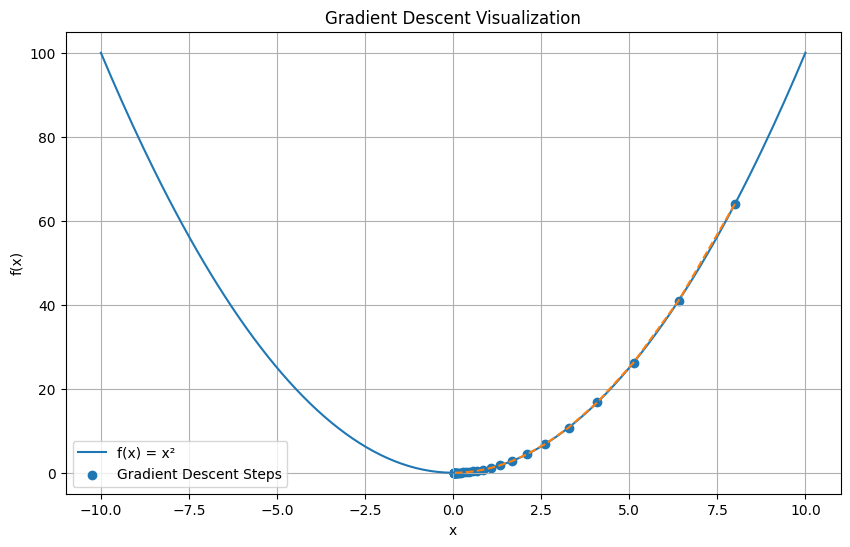

In [8]:
# -------------------------------
# Step 5: Visualize the result
# -------------------------------

x_values = np.linspace(-10, 10, 200)
y_values = function(x_values)

plt.figure(figsize=(10, 6))

# Plot the function curve
plt.plot(x_values, y_values, label="f(x) = x²")

# Plot gradient descent steps
plt.scatter(x_history, y_history, label="Gradient Descent Steps")

# Connect the steps with a line
plt.plot(x_history, y_history, linestyle="--")

plt.title("Gradient Descent Visualization")
plt.xlabel("x")
plt.ylabel("f(x)")
plt.legend()
plt.grid(True)

plt.show()

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


# -------------------------------
# Step 1: Define the function
# -------------------------------

def function(x, y):
    """
    Function we want to minimize.
    f(x, y) = x^2 + y^2
    Minimum is at (0, 0).
    """
    return x ** 2 + y ** 2


# -------------------------------
# Step 2: Define the gradients
# -------------------------------

def gradient_x(x):
    """
    Partial derivative with respect to x.
    d/dx of x^2 + y^2 = 2x
    """
    return 2 * x


def gradient_y(y):
    """
    Partial derivative with respect to y.
    d/dy of x^2 + y^2 = 2y
    """
    return 2 * y


# -------------------------------
# Step 3: Gradient descent settings
# -------------------------------

learning_rate = 0.1
iterations = 40

x = 8
y = 6

x_history = [x]
y_history = [y]
z_history = [function(x, y)]


# -------------------------------
# Step 4: Run gradient descent
# -------------------------------

for i in range(iterations):
    dx = gradient_x(x)
    dy = gradient_y(y)

    # Update x and y
    x = x - learning_rate * dx
    y = y - learning_rate * dy

    x_history.append(x)
    y_history.append(y)
    z_history.append(function(x, y))

    print(
        f"Iteration {i + 1}: "
        f"x = {x:.4f}, y = {y:.4f}, z = {function(x, y):.4f}"
    )


# -------------------------------
# Step 5: Create the 3D surface
# -------------------------------

x_values = np.linspace(-10, 10, 100)
y_values = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x_values, y_values)
Z = function(X, Y)


# -------------------------------
# Step 6: Prepare the 3D plot
# -------------------------------

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection="3d")

ax.plot_surface(X, Y, Z, alpha=0.6)

point, = ax.plot([], [], [], "o", markersize=8, label="Current Position")
path, = ax.plot([], [], [], "--", label="Gradient Descent Path")

ax.set_title("3D Gradient Descent Animation")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("f(x, y)")
ax.legend()


# -------------------------------
# Step 7: Animation update function
# -------------------------------

def update(frame):
    current_x = x_history[frame]
    current_y = y_history[frame]
    current_z = z_history[frame]

    point.set_data([current_x], [current_y])
    point.set_3d_properties([current_z])

    path.set_data(x_history[:frame + 1], y_history[:frame + 1])
    path.set_3d_properties(z_history[:frame + 1])

    ax.set_title(
        f"3D Gradient Descent Animation | Step {frame}"
    )

    return point, path


# -------------------------------
# Step 8: Run animation
# -------------------------------

anim = FuncAnimation(
    fig,
    update,
    frames=len(x_history),
    interval=300,
    blit=False,
    repeat=False
)

plt.close(fig)

HTML(anim.to_jshtml())

Iteration 1: x = 6.4000, y = 4.8000, z = 64.0000
Iteration 2: x = 5.1200, y = 3.8400, z = 40.9600
Iteration 3: x = 4.0960, y = 3.0720, z = 26.2144
Iteration 4: x = 3.2768, y = 2.4576, z = 16.7772
Iteration 5: x = 2.6214, y = 1.9661, z = 10.7374
Iteration 6: x = 2.0972, y = 1.5729, z = 6.8719
Iteration 7: x = 1.6777, y = 1.2583, z = 4.3980
Iteration 8: x = 1.3422, y = 1.0066, z = 2.8147
Iteration 9: x = 1.0737, y = 0.8053, z = 1.8014
Iteration 10: x = 0.8590, y = 0.6442, z = 1.1529
Iteration 11: x = 0.6872, y = 0.5154, z = 0.7379
Iteration 12: x = 0.5498, y = 0.4123, z = 0.4722
Iteration 13: x = 0.4398, y = 0.3299, z = 0.3022
Iteration 14: x = 0.3518, y = 0.2639, z = 0.1934
Iteration 15: x = 0.2815, y = 0.2111, z = 0.1238
Iteration 16: x = 0.2252, y = 0.1689, z = 0.0792
Iteration 17: x = 0.1801, y = 0.1351, z = 0.0507
Iteration 18: x = 0.1441, y = 0.1081, z = 0.0325
Iteration 19: x = 0.1153, y = 0.0865, z = 0.0208
Iteration 20: x = 0.0922, y = 0.0692, z = 0.0133
Iteration 21: x = 0.0738